In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white", context='poster')
import math

In [5]:
import datashader as ds, datashader.transfer_functions as tf
import dask.dataframe as dd

In [6]:
%load_ext autoreload
%autoreload 2


In [7]:
plot_width  = int(900)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)

In [8]:
plot_width  = int(900)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)
#background = "black"
background=None

from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9

export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

In [9]:
import sys
sys.path.append('..')
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [10]:
corder = ['C1', 'C2', 'C3', 'C4', 'C0']

In [11]:
morder = ['EXOENZYME','OVERFLOW',   'ROS','MIXOTROPH','MIN', ]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
mpalette = sns.color_palette(mpalette, n_colors=5)
#morder = [morder[1]] + morder[3:]
#mpalette = [mpalette[1]] + mpalette[3:]
sns.color_palette(mpalette)

[(0.4828677867260272, 0.6304330455306234, 0.761915371498953),
 (0.3668108554010799, 0.26404857724525643, 0.6464799165290824),
 (0.18488035509396164, 0.07942573027972388, 0.21307651648984993),
 (0.5566322903496934, 0.17269677158182117, 0.31423043195101424),
 (0.775907907306857, 0.5355421788246119, 0.42413367909988375)]

In [12]:
gorder = [ 'Strong', 'Sustained', 'Inhibited', 'Weak', 'Axenic',   'Other']
gpalette = sns.color_palette('Set2', n_colors=4).as_hex() + ['black', 'lightgrey']
gpalette = ['#882255', '#CC6677', '#332288', 
             '#44AA99','#88CCEE',
            '#D0CFCA',  ]

sns.color_palette(gpalette)

[(0.5333333333333333, 0.13333333333333333, 0.3333333333333333),
 (0.8, 0.4, 0.4666666666666667),
 (0.2, 0.13333333333333333, 0.5333333333333333),
 (0.26666666666666666, 0.6666666666666666, 0.6),
 (0.5333333333333333, 0.8, 0.9333333333333333),
 (0.8156862745098039, 0.8117647058823529, 0.792156862745098)]

In [13]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [14]:
gorder1 = ['Strong', 'Sustained', 'Weak','Inhibited',  ]
gpalette1 = gpalette[:2] + [gpalette[3], gpalette[2], ]
sns.color_palette(gpalette1)

[(0.5333333333333333, 0.13333333333333333, 0.3333333333333333),
 (0.8, 0.4, 0.4666666666666667),
 (0.26666666666666666, 0.6666666666666666, 0.6),
 (0.2, 0.13333333333333333, 0.5333333333333333)]

In [15]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [16]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = '../results/final/ponly/'

In [17]:
import glob
import os
glob.glob(os.path.join(dpath, "*_sum*"))

['../results/final/ponly/monte_ponly_OVERFLOW-ROS-EXOENZYME_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_fix_OVERFLOW_clean_sum.csv.gz',
 '../results/final/ponly/ponly_monte_add_ROS_round2_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_add_OVERFLOW_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_EXOENZYME-ROS_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_strong_ponly_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-ROS-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-EXOENZYME-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-ROS_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_ROS-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_EXOENZYME-ROS-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOEN

In [18]:
'monte_ponly_clean_sum.csv.gz'
'monte_strong_ponly_clean_sum.csv.gz'
'monte_ponly_add_OVERFLOW_clean_sum.csv.gz'
'monte_ponly_fix_OVERFLOW_clean_sum.csv.gz'
'ponly_monte_add_ROS_round2_clean_sum.csv.gz'


'ponly_monte_add_ROS_round2_clean_sum.csv.gz'

In [19]:
sim_df1 = pd.read_csv(os.path.join(dpath,'monte_ponly_clean_sum.csv.gz',))
sim_df2 = pd.read_csv(os.path.join(dpath,'monte_strong_ponly_clean_sum.csv.gz',))
sim_df3 = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_OVERFLOW_clean_sum.csv.gz',))
sim_df4 = pd.read_csv(os.path.join(dpath,'monte_ponly_add_OVERFLOW_clean_sum.csv.gz',))
sim_df5 = pd.read_csv(os.path.join(dpath,'ponly_monte_add_ROS_round2_clean_sum.csv.gz',))


In [20]:
sim_df6 = pd.read_csv(os.path.join(dpath,'monte_extend_ponly_clean_sum.csv.gz',))

multi_ponly_orig_fnames = [
'monte_ponly_EXOENZYME-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_EXOENZYME-ROS_clean_sum.csv.gz',
'monte_ponly_EXOENZYME-ROS-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-EXOENZYME_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-EXOENZYME-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-ROS_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-ROS-EXOENZYME_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-ROS-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_ROS-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_clean_sum.csv.gz',
]
sim_df7 = pd.concat([pd.read_csv(os.path.join(dpath,f,)) for f in multi_ponly_orig_fnames], ignore_index=True)


In [21]:
sim_df1['Phase'] = 'init'
sim_df2['Phase'] = 'add'
sim_df3['Phase'] = 'init'
sim_df4['Phase'] = 'add'
sim_df5['Phase'] = 'round2'
sim_df6['Phase'] = 'extend'
sim_df7['Phase'] = 'init'


In [22]:
# remove buggy overflow simulations
sim_df1 = sim_df1.loc[~sim_df1.run_id.str.startswith('monte_ponly_OVERFLOW')].copy()
sim_df2 = sim_df2.loc[~sim_df2.run_id.str.startswith('monte2_ponly_OVERFLOW')].copy()


In [23]:
sim_df1[['id', 'media', 'which', 'model', 'hash']] =     sim_df1.run_id.str.rsplit('_', n=4, expand=True)
sim_df2[['id', 'media', 'which', 'model', 'hash']] =     sim_df2.run_id.str.rsplit('_', n=4, expand=True)
sim_df3[['id', 'media', 'which', 'model', 'hash']] =     sim_df3.run_id.str.rsplit('_', n=4, expand=True)
sim_df4[['id', 'media', 'which', 'model', 'hash']] =     sim_df4.run_id.str.rsplit('_', n=4, expand=True)
sim_df5[['id', 'media', 'which', 'model', 'hash']] =     sim_df5.run_id.str.rsplit('_', n=4, expand=True)
sim_df6[['id', 'media', 'which', 'model', 'hash']] =     sim_df6.run_id.str.rsplit('_', n=4, expand=True)
sim_df7[['id', 'media', 'which', 'model', 'hash']] =     sim_df7.run_id.str.rsplit('_', n=4, expand=True)


In [24]:
sim_df1['VPRO_nocluster'] = sim_df1.idx.str.replace('monte_ponly_','vpro_', regex=False)
sim_df1['VPRO_nocluster'] = sim_df1['VPRO_nocluster'].str.replace('_monte__','_', regex=False)
for m in morder:
    sim_df1['VPRO_nocluster'] = sim_df1['VPRO_nocluster'].str.replace(f'_{m}_','_', regex=False)


In [25]:
sim_df2['VPRO'] = sim_df2.idx.str.replace('monte2_ponly_','', regex=False)
sim_df2['VPRO'] = sim_df2['VPRO'].str.replace(r'_monte__(\d+)_[^_]+$', r'\1', regex=True)
sim_df2['VPRO'] = sim_df2['VPRO'].str.replace(r'.*_vpro', 'vpro', regex=True)


In [26]:
sim_df3['VPRO'] = sim_df3.idx.str.replace('monte_ponly_fix_OVERFLOW_','vpro_2_', regex=False)
sim_df3['VPRO'] = sim_df3['VPRO'].str.replace('_monte__','_', regex=False)
for m in morder:
    sim_df3['VPRO'] = sim_df3['VPRO'].str.replace(f'_{m}_','_', regex=False)


In [27]:
sim_df4['VPRO'] = sim_df4.idx.str.replace('monte2_ponly_OVERFLOW_','', regex=False)
sim_df4['VPRO'] = sim_df4['VPRO'].str.replace(r'_monte__(\d+)_[^_]+$', r'\1', regex=True)
sim_df4['VPRO'] = sim_df4['VPRO'].str.replace(r'.*_vpro', 'vpro', regex=True)


In [28]:
#sim_df6['VPRO'] = sim_df6.idx.str.replace('monte2_ponly_OVERFLOW_','', regex=False)
sim_df5['VPRO'] = sim_df5['idx'].str.replace('_monte__','', regex=False)
sim_df5['VPRO'] = sim_df5['VPRO'].str.replace(r'.*_vpro', 'vpro_2', regex=True)


In [29]:
#sim_df6['VPRO'] = sim_df6.idx.str.replace('monte2_ponly_OVERFLOW_','', regex=False)
sim_df6['VPRO'] = sim_df6['idx'].str.replace('_monte__','_', regex=False)
sim_df6['VPRO'] = sim_df6['VPRO'].str.replace(r'.*_vpro', 'vpro_3', regex=True)


In [30]:
sim_df7['VPRO'] = sim_df7.idx.str.replace('monte_ponly_','vpro_', regex=False)
sim_df7['VPRO'] = sim_df7['VPRO'].str.replace('_monte__','_', regex=False)
for m in sim_df7.model.unique():
    sim_df7['VPRO'] = sim_df7['VPRO'].str.replace(f'_{m}_','_', regex=False)


In [31]:
sim_df2['VPRO_nocluster'] = sim_df2['VPRO']
sim_df3['VPRO_nocluster'] = sim_df3['VPRO']
sim_df4['VPRO_nocluster'] = sim_df4['VPRO']
sim_df5['VPRO_nocluster'] = sim_df5['VPRO']
sim_df6['VPRO_nocluster'] = sim_df6['VPRO']
sim_df7['VPRO_nocluster'] = sim_df7['VPRO']



In [32]:
df = pd.concat([
    sim_df1,
    sim_df2,
    sim_df3,
    sim_df4,
    sim_df5,
    sim_df6,
    sim_df7,
    
], ignore_index=True)

In [33]:
df

,VmaxICp,VmaxICh,VmaxINp,VmaxINh,VmaxOCp,VmaxOCh,VmaxONp,VmaxONh,KICp,KICh,...,run_id,idx,Phase,id,media,which,model,hash,VPRO_nocluster,VPRO
0,0.000002,0.0,2.563161e-06,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,37.000000,1.0,...,monte_ponly_EXOENZYME_76_monte__69_pro99_ponly...,monte_ponly_EXOENZYME_76_monte__69_EXOENZYME,init,monte_ponly_EXOENZYME_76_monte__69,pro99,ponly,EXOENZYME,h2291012746155587316,vpro_76_69_EXOENZYME,NaN
1,0.000006,0.0,3.520779e-05,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,24.605317,1.0,...,monte_ponly_EXOENZYME_86_monte__38_lowN_ponly_...,monte_ponly_EXOENZYME_86_monte__38_EXOENZYME,init,monte_ponly_EXOENZYME_86_monte__38,lowN,ponly,EXOENZYME,h2291012746155587316,vpro_86_38_EXOENZYME,NaN
2,0.000030,0.0,1.030144e-05,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,215.112381,1.0,...,monte_ponly_EXOENZYME_29_monte__60_pro99_ponly...,monte_ponly_EXOENZYME_29_monte__60_EXOENZYME,init,monte_ponly_EXOENZYME_29_monte__60,pro99,ponly,EXOENZYME,h2291012746155587316,vpro_29_60_EXOENZYME,NaN
3,0.000005,0.0,6.256836e-06,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,8.853069,1.0,...,monte_ponly_EXOENZYME_23_monte__20_lowN_ponly_...,monte_ponly_EXOENZYME_23_monte__20_EXOENZYME,init,monte_ponly_EXOENZYME_23_monte__20,lowN,ponly,EXOENZYME,h2291012746155587316,vpro_23_20_EXOENZYME,NaN
4,0.000004,0.0,7.170524e-06,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,7.193827,1.0,...,monte_ponly_EXOENZYME_20_monte__81_lowN_ponly_...,monte_ponly_EXOENZYME_20_monte__81_EXOENZYME,init,monte_ponly_EXOENZYME_20_monte__81,lowN,ponly,EXOENZYME,h2291012746155587316,vpro_20_81_EXOENZYME,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466169,0.000006,0.0,1.201227e-05,0.000067,1.851852e-06,6.666667e-05,7.544491e-07,6.666667e-05,7.601540,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_6...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_6...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_6...,lowN,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_67_32_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_67_32_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
466170,0.000002,0.0,5.716312e-07,0.000067,2.462753e-07,6.666667e-05,2.545232e-07,6.666667e-05,10.321623,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_2...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_2...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_2...,lowN,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_20_74_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_20_74_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
466171,0.000006,0.0,5.555556e-06,0.000067,1.851852e-06,6.666667e-05,1.111111e-06,6.666667e-05,37.000000,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_3...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_3...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_3...,lowN,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_3_93_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_3_93_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
466172,0.000032,0.0,2.628276e-05,0.000067,1.665043e-06,6.666667e-05,2.714144e-07,6.666667e-05,37.000000,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_7...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_7...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_7...,pro99,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_79_86_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_79_86_ROS-MIXOTROPH-OVERFLOW-EXOENZYME


In [34]:
df[['Phase', 'media']].value_counts()

Phase   media
init    pro99    159638
        lowN     159638
extend  pro99     58786
        lowN      58786
round2  lowN       8462
        pro99      8462
add     lowN       6201
        pro99      6201
Name: count, dtype: int64

In [35]:
df = df.loc[df.media.isin(['lowN'])].copy()

In [36]:
df[['Phase', 'model']].value_counts()

Phase   model                           
init    EXOENZYME-ROS-MIXOTROPH             10000
        ROS-MIXOTROPH                        9999
        EXOENZYME-MIXOTROPH                  9998
        OVERFLOW-EXOENZYME-MIXOTROPH         9997
        OVERFLOW-ROS-MIXOTROPH               9997
        MIXOTROPH                            9997
        OVERFLOW-MIXOTROPH                   9997
        ROS-MIXOTROPH-OVERFLOW-EXOENZYME     9994
        OVERFLOW-EXOENZYME                   9962
        EXOENZYME-ROS                        9960
        EXOENZYME                            9959
        ROS                                  9958
        MIN                                  9958
        OVERFLOW-ROS-EXOENZYME               9958
        OVERFLOW                             9955
        OVERFLOW-ROS                         9949
round2  ROS                                  8462
extend  OVERFLOW-EXOENZYME                   4966
        OVERFLOW-MIXOTROPH                   4395
        M

In [37]:
vpro_df = pd.read_csv('../ML_model/versatile_vpros.csv')

In [38]:
vpro_df['VPRO_nocluster'] =  vpro_df.VPRO.str.replace(r'_C\d$', '', regex=True)

In [39]:
vpro_df

,model,Phase,VPRO,Inhibited,Neutral,Other,Strong,Sustained,Weak,pos_interaction,...,simulations_per_VPRO,Versatile_STR,MODEL,EXOENZYME,OVERFLOW,ROS,MIXOTROPH,MIN,% positive,VPRO_nocluster
0,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_15,0,0,0.0,0.0,0.0,24,0,...,24.0,Negative VPRO,E,True,False,False,False,False,0.000000,vpro_11_62_EXOENZYME_C1_15
1,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_20,0,1,2.0,0.0,9.0,77,9,...,89.0,Versatile VPRO,E,True,False,False,False,False,0.101124,vpro_11_62_EXOENZYME_C1_20
2,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_22,0,0,0.0,0.0,0.0,27,0,...,27.0,Negative VPRO,E,True,False,False,False,False,0.000000,vpro_11_62_EXOENZYME_C1_22
3,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_32,0,3,0.0,0.0,0.0,23,0,...,26.0,Negative VPRO,E,True,False,False,False,False,0.000000,vpro_11_62_EXOENZYME_C1_32
4,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_37,0,29,0.0,0.0,0.0,35,0,...,64.0,Negative VPRO,E,True,False,False,False,False,0.000000,vpro_11_62_EXOENZYME_C1_37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19771,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_82_9_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,0,0.0,0.0,0.0,209,0,...,209.0,Negative VPRO,EORM,True,True,True,True,False,0.000000,vpro_82_9_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
19772,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_86_79_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,19,4.0,0.0,0.0,237,0,...,260.0,Negative VPRO,EORM,True,True,True,True,False,0.000000,vpro_86_79_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
19773,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_95_6_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,16,56.0,236.0,1.0,0,237,...,309.0,Positive VPRO,EORM,True,True,True,True,False,0.766990,vpro_95_6_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
19774,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_97_54_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,127,123.0,0.0,17.0,15,17,...,282.0,Versatile VPRO,EORM,True,True,True,True,False,0.060284,vpro_97_54_ROS-MIXOTROPH-OVERFLOW-EXOENZYME


In [40]:
sim_df3.VPRO_nocluster.unique()

array(['vpro_2_33_91_OVERFLOW', 'vpro_2_85_7_OVERFLOW',
       'vpro_2_5_8_OVERFLOW', ..., 'vpro_2_53_7_OVERFLOW',
       'vpro_2_36_18_OVERFLOW', 'vpro_2_68_22_OVERFLOW'], dtype=object)

In [41]:
vpro_df.loc[
    #~vpro_df.VPRO.isin(df.VPRO) 
    ~vpro_df.VPRO_nocluster.isin(df.VPRO_nocluster)
][['Phase', 'model']].value_counts()


Series([], Name: count, dtype: int64)

In [42]:
vpro_df.loc[
    #~vpro_df.VPRO.isin(df.VPRO) 
    ~vpro_df.VPRO_nocluster.isin(df.VPRO_nocluster)
]#[['Phase', 'model']].value_counts()


,model,Phase,VPRO,Inhibited,Neutral,Other,Strong,Sustained,Weak,pos_interaction,...,simulations_per_VPRO,Versatile_STR,MODEL,EXOENZYME,OVERFLOW,ROS,MIXOTROPH,MIN,% positive,VPRO_nocluster


In [43]:
df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'Phase', 'id', 'media', 'which', 'model', 'hash',
       'VPRO_nocluster', 'VPRO'],
      dtype='object')

In [44]:
df = pd.merge(df, vpro_df[['VPRO_nocluster', 'Versatile_STR']], on='VPRO_nocluster', how='left')



In [45]:
df['Versatile_STR'] = df.Versatile_STR.fillna('Not VPRO')

In [46]:
df['Versatile_STR'].value_counts()


Versatile_STR
Not VPRO          213311
Negative VPRO      14386
Versatile VPRO      4242
Positive VPRO       1148
Name: count, dtype: int64

In [47]:
df = df.reset_index(drop=True)

In [48]:
df.groupby(['model', 'VPRO']).size() #.value_counts()

model                             VPRO                                      
EXOENZYME                         vpro_11_62_EXOENZYME_C1_0                     1
                                  vpro_11_62_EXOENZYME_C1_1                     1
                                  vpro_11_62_EXOENZYME_C1_10                    1
                                  vpro_11_62_EXOENZYME_C1_11                    1
                                  vpro_11_62_EXOENZYME_C1_12                    1
                                                                               ..
ROS-MIXOTROPH-OVERFLOW-EXOENZYME  vpro_9_96_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_97_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_98_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_99_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_9_ROS-MIXOTROPH-OVERFLOW-EXOENZYME     1
Length: 193215, dtype

In [49]:
df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'Phase', 'id', 'media', 'which', 'model', 'hash',
       'VPRO_nocluster', 'VPRO', 'Versatile_STR'],
      dtype='object')

In [50]:
id_vars=[
    'run_id', 'idx', 'Phase', 'id',  'model', 
       'VPRO_nocluster',  'Versatile_STR'
       ]
def _get_params_df(model):
    pparams_to_update, pbounds, plog_params = get_param_tuning_values(model, 'PRO')
    param_vals_map = get_param_vals(model)
    
    params_to_update = [p for p in pparams_to_update if p in df.columns]

    param_vals_df = df.loc[df.model.isin([model]), 
                                id_vars + pparams_to_update ]
    mparam_vals = param_vals_df.melt( id_vars=id_vars)    
    mparam_vals['default'] = mparam_vals['variable'].map(param_vals_map)
    mparam_vals['FC'] = np.log2(mparam_vals.value / mparam_vals.default)

    return mparam_vals
mparams_df = pd.concat([_get_params_df(model) for model in df.model.unique()], ignore_index=True)

In [51]:
per_sec_varnames =     [
    'VmaxICp', 'VmaxINp',  'Mp', 
       'Koverflowp', 'KprodROSp', 'KlossROSp', 'omegaP', 'VmaxOCp',
       'VmaxONp', 
]
mask = mparams_df.variable.isin(per_sec_varnames)
mparams_df.loc[mask, 'value']  = mparams_df.loc[mask, 'value']* seconds_in_day

In [52]:
mparams_df.loc[mparams_df.model.isin(['ROS']), 'model1'] = 'ROS'
mparams_df.loc[mparams_df.model.isin(['OVERFLOW', 'EXOENZYME']), 'model1'] = 'OVERFLOW/EXOENZYME'


In [53]:
mparams_df

,run_id,idx,Phase,id,model,VPRO_nocluster,Versatile_STR,variable,value,default,FC,model1
0,monte_ponly_EXOENZYME_86_monte__38_lowN_ponly_...,monte_ponly_EXOENZYME_86_monte__38_EXOENZYME,init,monte_ponly_EXOENZYME_86_monte__38,EXOENZYME,vpro_86_38_EXOENZYME,Not VPRO,VmaxICp,0.480000,0.000006,0.000000,OVERFLOW/EXOENZYME
1,monte_ponly_EXOENZYME_23_monte__20_lowN_ponly_...,monte_ponly_EXOENZYME_23_monte__20_EXOENZYME,init,monte_ponly_EXOENZYME_23_monte__20,EXOENZYME,vpro_23_20_EXOENZYME,Not VPRO,VmaxICp,0.395899,0.000006,-0.277900,OVERFLOW/EXOENZYME
2,monte_ponly_EXOENZYME_20_monte__81_lowN_ponly_...,monte_ponly_EXOENZYME_20_monte__81_EXOENZYME,init,monte_ponly_EXOENZYME_20_monte__81,EXOENZYME,vpro_20_81_EXOENZYME,Not VPRO,VmaxICp,0.386407,0.000006,-0.312912,OVERFLOW/EXOENZYME
3,monte_ponly_EXOENZYME_77_monte__35_lowN_ponly_...,monte_ponly_EXOENZYME_77_monte__35_EXOENZYME,init,monte_ponly_EXOENZYME_77_monte__35,EXOENZYME,vpro_77_35_EXOENZYME,Not VPRO,VmaxICp,0.480000,0.000006,0.000000,OVERFLOW/EXOENZYME
4,monte_ponly_EXOENZYME_35_monte__45_lowN_ponly_...,monte_ponly_EXOENZYME_35_monte__45_EXOENZYME,init,monte_ponly_EXOENZYME_35_monte__45,EXOENZYME,vpro_35_45_EXOENZYME,Not VPRO,VmaxICp,4.668549,0.000006,3.281868,OVERFLOW/EXOENZYME
...,...,...,...,...,...,...,...,...,...,...,...,...
2289329,monte_ponly_ROS-MIXOTROPH_22_monte__31_lowN_po...,monte_ponly_ROS-MIXOTROPH_22_monte__31_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_22_monte__31,ROS-MIXOTROPH,vpro_22_31_ROS-MIXOTROPH,Not VPRO,omegaP,13.379887,0.000034,2.185001,nan
2289330,monte_ponly_ROS-MIXOTROPH_73_monte__43_lowN_po...,monte_ponly_ROS-MIXOTROPH_73_monte__43_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_73_monte__43,ROS-MIXOTROPH,vpro_73_43_ROS-MIXOTROPH,Not VPRO,omegaP,1.560287,0.000034,-0.915182,nan
2289331,monte_ponly_ROS-MIXOTROPH_92_monte__79_lowN_po...,monte_ponly_ROS-MIXOTROPH_92_monte__79_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_92_monte__79,ROS-MIXOTROPH,vpro_92_79_ROS-MIXOTROPH,Not VPRO,omegaP,1.901064,0.000034,-0.630186,nan
2289332,monte_ponly_ROS-MIXOTROPH_94_monte__82_lowN_po...,monte_ponly_ROS-MIXOTROPH_94_monte__82_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_94_monte__82,ROS-MIXOTROPH,vpro_94_82_ROS-MIXOTROPH,Not VPRO,omegaP,2.942400,0.000034,0.000000,nan


In [54]:
df.Versatile_STR.unique()


array(['Not VPRO', 'Versatile VPRO', 'Positive VPRO', 'Negative VPRO'],
      dtype=object)

In [55]:
df.Versatile_STR.unique()
vorder = ['Versatile VPRO', 'Positive VPRO', 'Negative VPRO',  'Not VPRO',]
vpalette = [
    '#5E392F', 
    '#DC267F',
    #'#FE6100',
    '#648FFF',
    #'#785EF0',
    '#b3b3b3',
]
print (vorder)
sns.color_palette(vpalette)


['Versatile VPRO', 'Positive VPRO', 'Negative VPRO', 'Not VPRO']


[(0.3686274509803922, 0.2235294117647059, 0.1843137254901961),
 (0.8627450980392157, 0.14901960784313725, 0.4980392156862745),
 (0.39215686274509803, 0.5607843137254902, 1.0),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

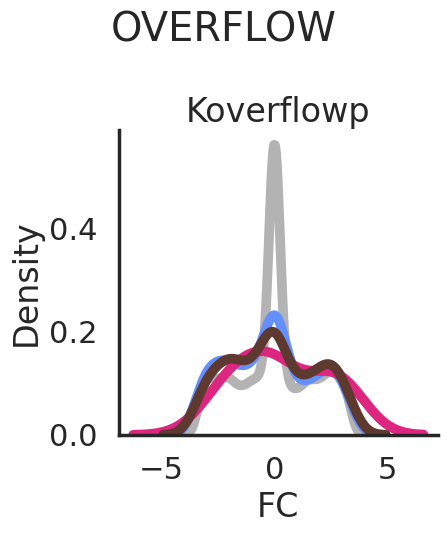

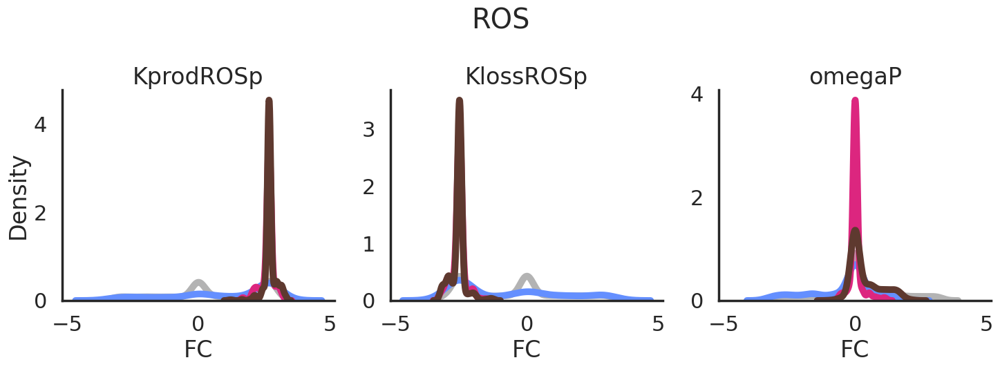

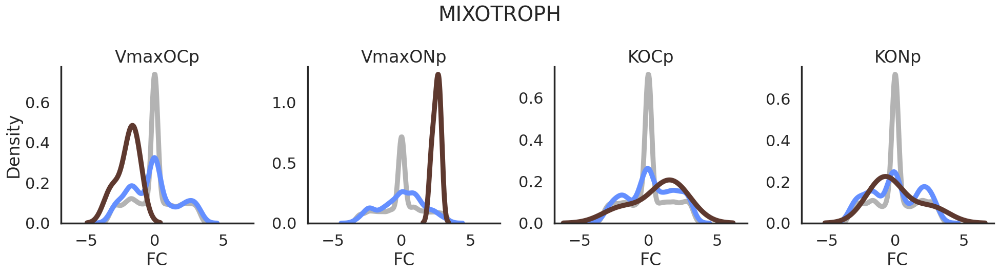

In [56]:
sns.set_context('poster')
min_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')

for model in morder:
    cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values(model, 'PRO')
    cur_pro_params_to_update = [p for p in cur_pro_params_to_update if p not in min_pro_params_to_update]
    if cur_pro_params_to_update:
        sns.displot(
            data=mparams_df.loc[ 
                ~mparams_df['FC'].isna() & 
                mparams_df['variable'].isin(cur_pro_params_to_update) &
                mparams_df['model'].isin([model]) 
    
                               ].reset_index(), 
            common_norm=False,
            col='variable', x='FC', #col_wrap=4, #order=gorder,
            hue='Versatile_STR', hue_order=vorder, palette=vpalette,
            lw=7,
            kind='kde',
            facet_kws=dict(sharey=False),
            col_order=cur_pro_params_to_update,
            legend=False,
        ).set_titles(col_template='{col_name}', row_template='{row_name}')
        plt.suptitle(model, y=1.1)

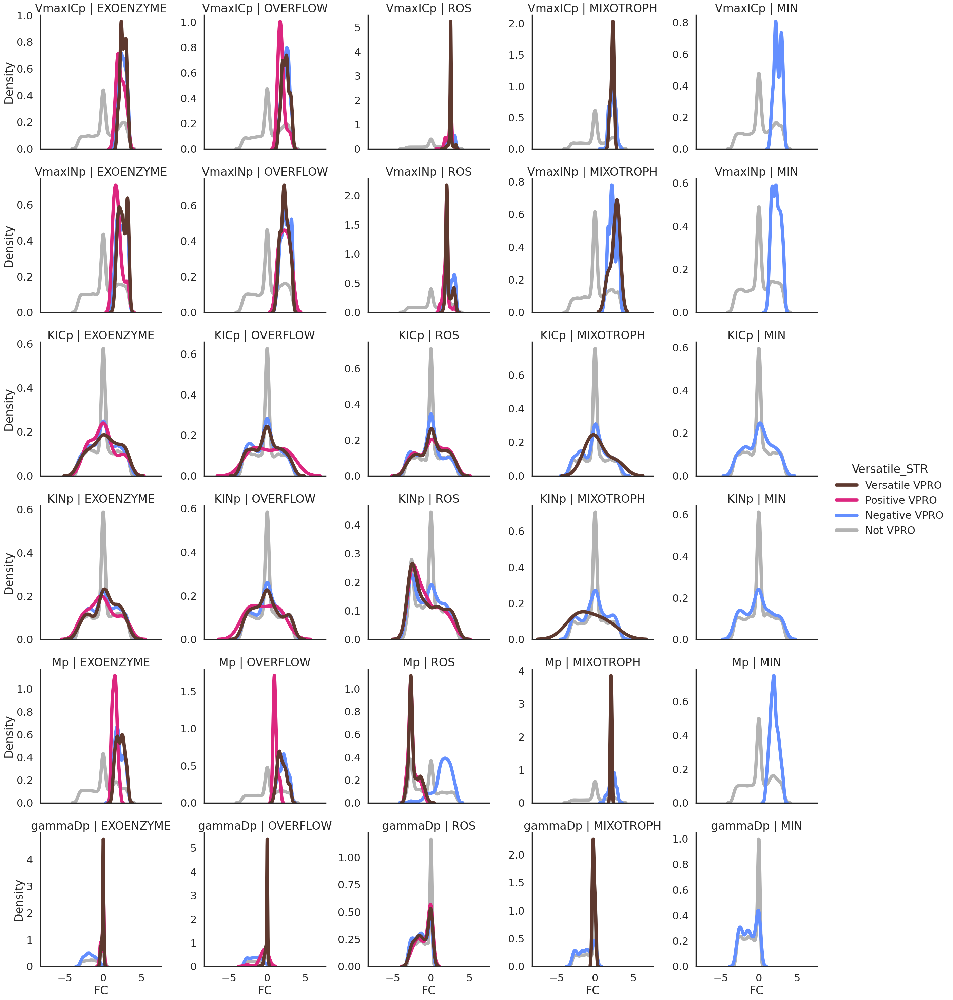

In [57]:
sns.set_context('poster')
cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    row='variable', x='FC', row_order=cur_pro_params_to_update,
    col='model', col_order=morder,
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=7,
    kind='kde',
    facet_kws=dict(sharey=False),
).set_titles(col_template='{col_name}', row_template='{row_name}')


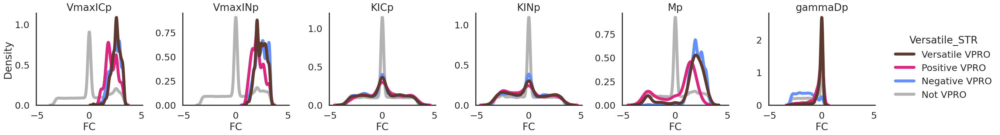

In [58]:
sns.set_context('poster')
cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='FC', col_order=cur_pro_params_to_update,
    #col='model', col_order=morder,
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=7,
    kind='kde',
    facet_kws=dict(sharey=False),
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [59]:
mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        ~mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].model.unique()

array(['MIXOTROPH', 'ROS', 'OVERFLOW', 'EXOENZYME-MIXOTROPH',
       'EXOENZYME-ROS-MIXOTROPH', 'EXOENZYME-ROS',
       'OVERFLOW-EXOENZYME-MIXOTROPH', 'OVERFLOW-EXOENZYME',
       'OVERFLOW-MIXOTROPH', 'OVERFLOW-ROS-EXOENZYME',
       'OVERFLOW-ROS-MIXOTROPH', 'OVERFLOW-ROS',
       'ROS-MIXOTROPH-OVERFLOW-EXOENZYME', 'ROS-MIXOTROPH'], dtype=object)

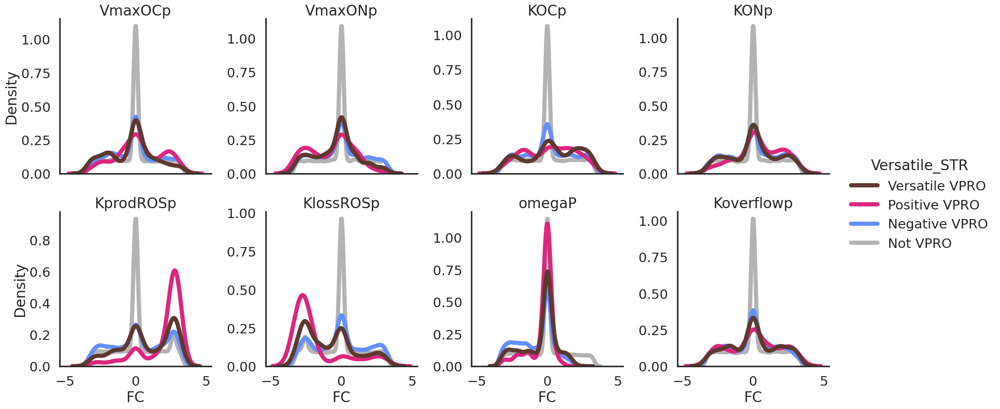

In [76]:
sns.set_context('poster')
cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        ~mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='FC', #col_order=cur_pro_params_to_update,
    #col='model', col_order=morder,
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=7,
    kind='kde', col_wrap=4,
    facet_kws=dict(sharey=False),
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [61]:
cur_pro_params_to_update

['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp']

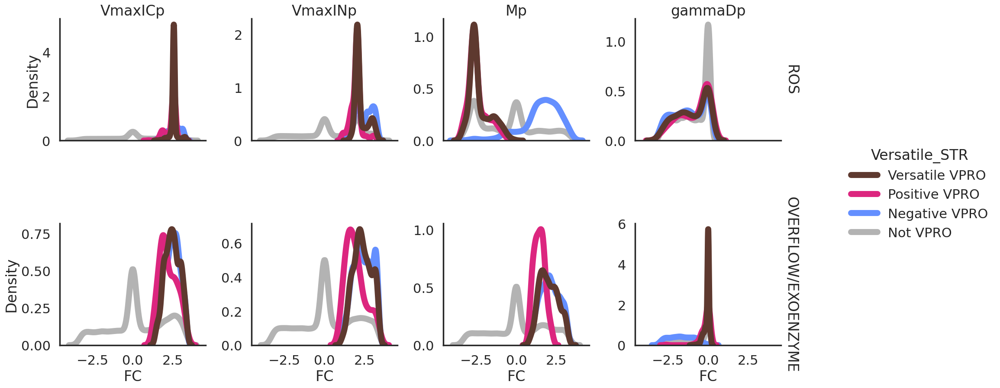

In [62]:
sns.set_context('poster')
porder = ['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp']
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(porder) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='FC', col_order=porder,
    row='model1', row_order=['ROS', 'OVERFLOW/EXOENZYME'],
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=10,
    kind='kde', 
    facet_kws=dict(sharey=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [63]:
fmparams_df = mparams_df.pivot(
    index=id_vars + ['model1'],
    columns='variable', values='FC'
)

In [64]:
pmparams_df = mparams_df.pivot(
    index=id_vars + ['model1'],
    columns='variable', values='value'
)

In [65]:
pmparams_df = pmparams_df.reset_index()
fmparams_df = fmparams_df.reset_index()


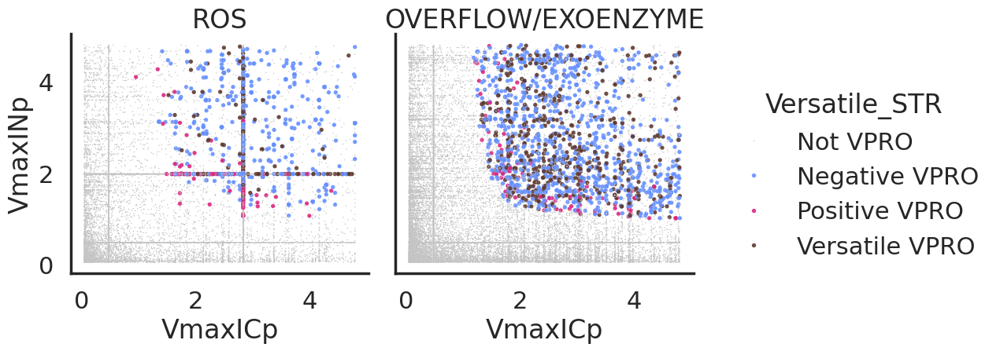

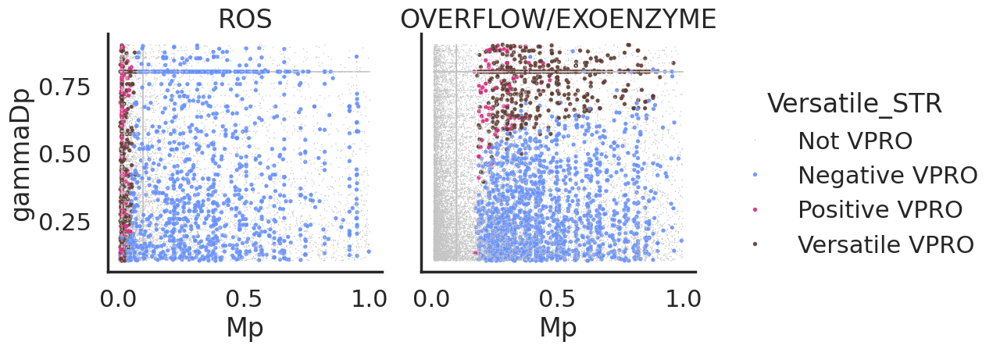

In [66]:
sns.set_context('poster')
 
for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
    sns.relplot(
        data=pmparams_df, 
        #common_norm=False,
        x=i, y=j,
        col='model1', col_order=['ROS', 'OVERFLOW/EXOENZYME'],
        hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
        #s=10,
        size='Versatile_STR', size_order=reversed(vorder), sizes=dict(zip(vorder, [15, 15,15,1])), alpha=0.9,
        #lw=10,
        #kind='kde', 
        facet_kws=dict(margin_titles=True),
    ).set_titles(col_template='{col_name}', row_template='{row_name}')


In [67]:
pmparams_df.columns

Index(['run_id', 'idx', 'Phase', 'id', 'model', 'VPRO_nocluster',
       'Versatile_STR', 'model1', 'KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP'],
      dtype='object', name='variable')

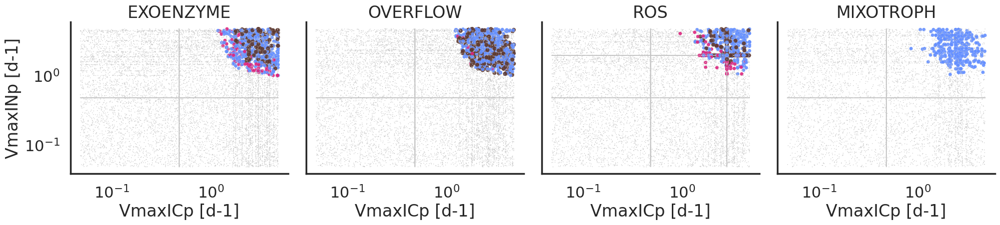

In [68]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('VmaxICp', 'VmaxINp')
sns.relplot(
    data=pmparams_df, 
    #common_norm=False,
    x=i, y=j,
    col='model', col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    xlabel=f'{i} [d-1]',
    ylabel=f'{j} [d-1]',
)
#plt.suptitle('Versatile VPRO')

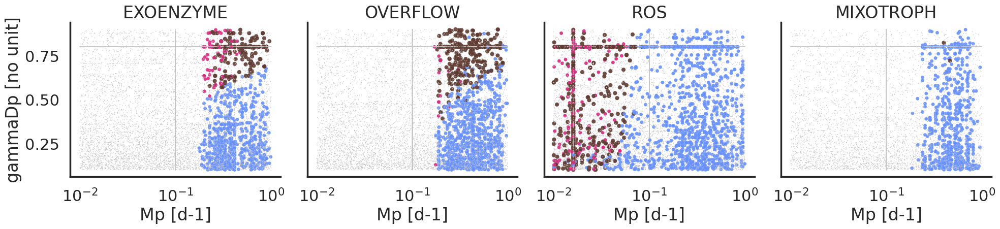

In [69]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'gammaDp')
sns.relplot(
    data=pmparams_df, 
    #common_norm=False,
    x=i, y=j,
    col='model', col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', #yscale='log',
    xlabel=f'{i} [d-1]',
    ylabel=f'{j} [no unit]',
)


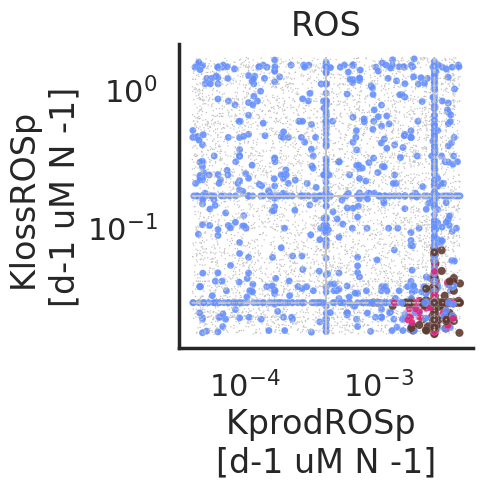

In [70]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('KprodROSp', 'KlossROSp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    x=i, y=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    xlabel=f'{i} \n[d-1 uM N -1]',
    ylabel=f'{j} \n[d-1 uM N -1]',
)


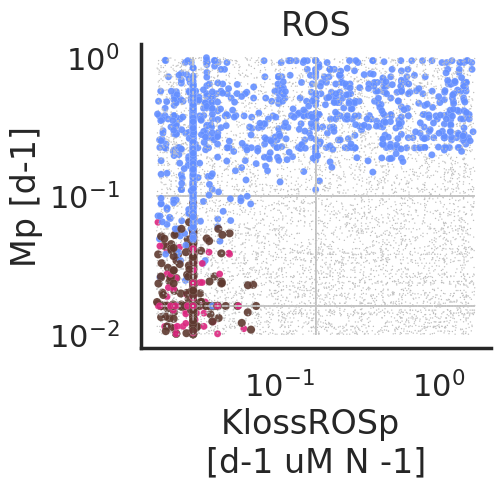

In [71]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'KlossROSp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    y=i, x=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False, aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    ylabel=f'{i} [d-1]',
    xlabel=f'{j} \n[d-1 uM N -1]',
)


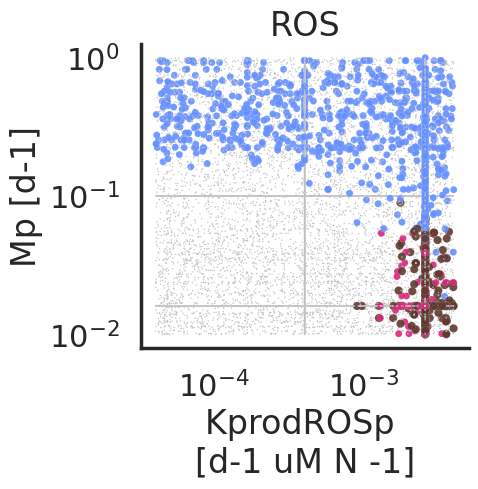

In [72]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'KprodROSp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    y=i, x=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    ylabel=f'{i} [d-1]',
    xlabel=f'{j} \n[d-1 uM N -1]',
)


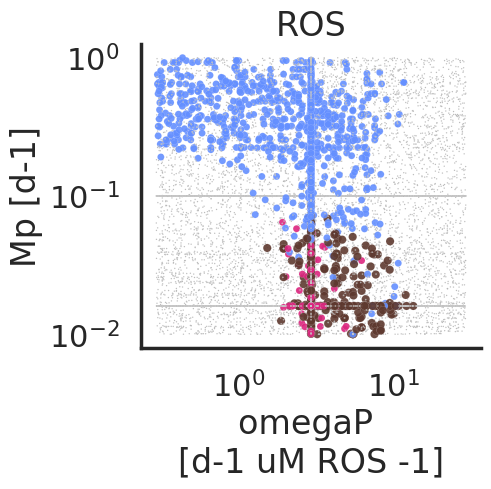

In [74]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'omegaP')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    y=i, x=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    ylabel=f'{i} [d-1]',
    xlabel=f'{j} \n[d-1 uM ROS -1]',
)


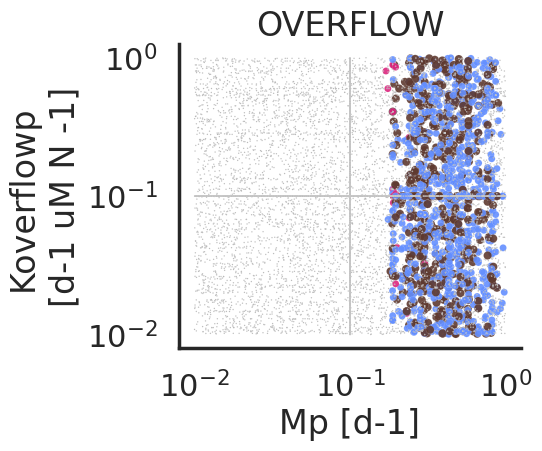

In [75]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'Koverflowp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['OVERFLOW'])], 
    #common_norm=False,
    x=i, y=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    xlabel=f'{i} [d-1]',
    ylabel=f'{j} \n[d-1 uM N -1]',
)


In [70]:
fmparams_df.columns

Index(['run_id', 'idx', 'Phase', 'id', 'model', 'VPRO_nocluster',
       'Versatile_STR', 'model1', 'KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP'],
      dtype='object', name='variable')

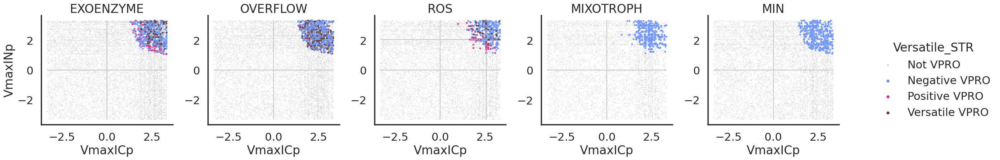

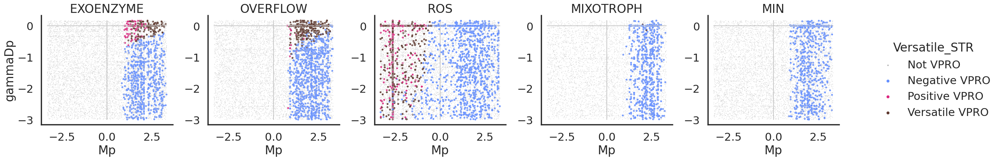

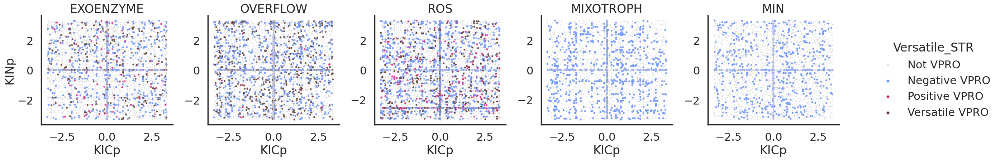

In [71]:
sns.set_context('poster')
 
for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp'), ('KICp', 'KINp')]:
    sns.relplot(
        data=fmparams_df, 
        #common_norm=False,
        x=i, y=j,
        col='model', col_order=morder,
        hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
        size='Versatile_STR', size_order=reversed(vorder), sizes=dict(zip(vorder, [15, 15,15,1])), alpha=0.9,
        facet_kws=dict(sharey=False, margin_titles=True),
    ).set_titles(col_template='{col_name}', row_template='{row_name}')


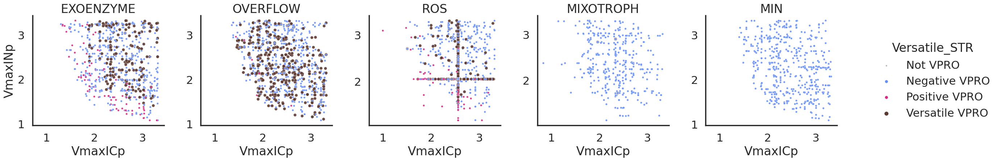

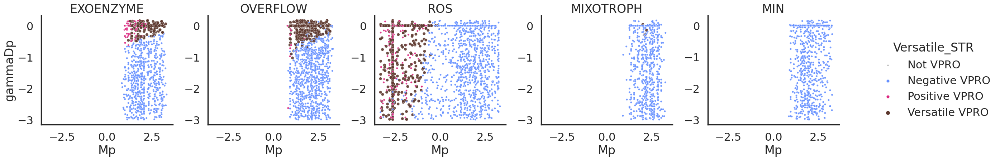

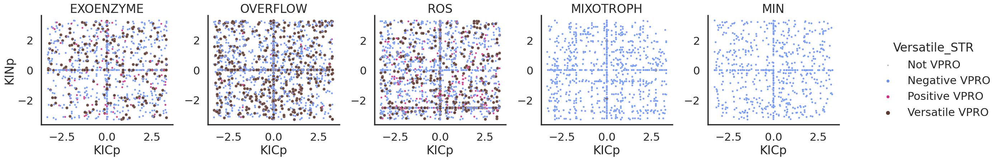

In [72]:
sns.set_context('poster')
 
for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp'), ('KICp', 'KINp')]:
    sns.relplot(
        data=fmparams_df.loc[~fmparams_df.Versatile_STR.isin(['Not VPRO'])], 
        #common_norm=False,
        x=i, y=j,
        col='model', col_order=morder,
        hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
        size='Versatile_STR', size_order=reversed(vorder), sizes=dict(zip(vorder, [35, 15,15,1])), alpha=0.9,
        facet_kws=dict(sharey=False, margin_titles=True),
    ).set_titles(col_template='{col_name}', row_template='{row_name}')


In [73]:
pmparams_df['isVPRO'] = pmparams_df.Versatile_STR.map({
    'Versatile VPRO' : 'VPRO', 'Positive VPRO' : 'VPRO', 'Negative VPRO' : 'VPRO', 'Not VPRO' : 'Not VPRO'
})
pmparams_df['isVERS'] = pmparams_df.Versatile_STR.map({
    'Versatile VPRO' : 'VERS', 'Positive VPRO' : 'VPRO', 'Negative VPRO' : 'VPRO', 'Not VPRO' : 'Not VPRO'
})

pmparams_df['isROS'] = 'Not ROS'
pmparams_df.loc[pmparams_df.model.isin(['ROS']),'isROS'] = 'ROS'


In [74]:
pmparams_df.loc[pmparams_df.model.isin(morder[:-1])].groupby(['isVPRO'])[['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std'])

variable   VmaxICp             VmaxINp                  Mp            \
              mean       std      mean       std      mean       std   
isVPRO                                                                 
Not VPRO  1.212112  1.221687  1.119548  1.171978  0.191663  0.226838   
VPRO      2.739739  0.771236  2.633642  0.992497  0.388624  0.228675   

variable   gammaDp            
              mean       std  
isVPRO                        
Not VPRO  0.511141  0.272602  
VPRO      0.447217  0.261333

In [75]:
pmparams_df.loc[pmparams_df.model.isin(morder[:-1])].groupby(['isVERS'])[['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std'])

variable   VmaxICp             VmaxINp                  Mp            \
              mean       std      mean       std      mean       std   
isVERS                                                                 
Not VPRO  1.212112  1.221687  1.119548  1.171978  0.191663  0.226838   
VERS      2.811557  0.737801  2.555239  0.925753  0.279184  0.246273   
VPRO      2.719931  0.779119  2.655267  1.009155  0.418808  0.213972   

variable   gammaDp            
              mean       std  
isVERS                        
Not VPRO  0.511141  0.272602  
VERS      0.653908  0.225570  
VPRO      0.390210  0.240985

In [76]:
pmparams_df.loc[pmparams_df.model.isin(morder[:-1])].groupby(['isROS', 'isVERS', ])[['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std'])

variable           VmaxICp             VmaxINp                  Mp            \
                      mean       std      mean       std      mean       std   
isROS   isVERS                                                                 
Not ROS Not VPRO  1.109417  1.184552  1.064333  1.181490  0.209576  0.229030   
        VERS      2.780367  0.877049  2.651231  1.000484  0.440287  0.177300   
        VPRO      2.613777  0.808661  2.660640  1.039008  0.468718  0.173783   
ROS     Not VPRO  1.432331  1.270077  1.237950  1.142384  0.153250  0.217142   
        VERS      2.861143  0.428591  2.402632  0.769243  0.023064  0.013347   
        VPRO      2.917329  0.678380  2.645275  0.951388  0.325999  0.248083   

variable           gammaDp            
                      mean       std  
isROS   isVERS                        
Not ROS Not VPRO  0.512366  0.272808  
        VERS      0.767154  0.076801  
        VPRO      0.362117  0.225451  
ROS     Not VPRO  0.508514  0.272148  
        VERS      0.473871  0.263904  
        VPRO      0.442449  0.259592

In [77]:
pmparams_df.loc[pmparams_df.model.isin(['ROS'])].groupby(['isVERS'])[[
    'KlossROSp',
        'KprodROSp',  'omegaP'
 ]].agg(['mean', 'std'])

variable KlossROSp           KprodROSp              omegaP          
              mean       std      mean       std      mean       std
isVERS                                                              
Not VPRO  0.252124  0.353835  0.001182  0.001112  4.902021  5.730271
VERS      0.028317  0.006156  0.002691  0.000395  4.142842  2.056878
VPRO      0.235981  0.385895  0.001658  0.001145  2.830769  1.710204

In [78]:
pmparams_df.loc[pmparams_df.model.isin(['OVERFLOW'])].groupby(['isVERS'])[[
    'Koverflowp',
 ]].agg(['mean', 'std'])

variable Koverflowp          
               mean       std
isVERS                       
Not VPRO   0.188818  0.226418
VERS       0.207108  0.251406
VPRO       0.195974  0.244965

In [79]:
df.pivot_table(columns='Versatile_STR', index='model', values='idx', aggfunc='count')

Versatile_STR,Negative VPRO,Not VPRO,Positive VPRO,Versatile VPRO
model,,,,
EXOENZYME,665.0,15737.0,103.0,235.0
EXOENZYME-MIXOTROPH,834.0,12077.0,51.0,136.0
EXOENZYME-ROS,536.0,12132.0,55.0,229.0
EXOENZYME-ROS-MIXOTROPH,1009.0,12520.0,78.0,390.0
MIN,718.0,13593.0,NaN,NaN
MIXOTROPH,1235.0,12257.0,NaN,4.0
OVERFLOW,973.0,15312.0,16.0,540.0
OVERFLOW-EXOENZYME,713.0,13792.0,144.0,279.0
OVERFLOW-EXOENZYME-MIXOTROPH,941.0,12552.0,215.0,284.0


In [80]:
df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'Phase', 'id', 'media', 'which', 'model', 'hash',
       'VPRO_nocluster', 'VPRO', 'Versatile_STR'],
      dtype='object')

In [81]:
vpro_df.loc[vpro_df.Versatile.isin([True]) & vpro_df.model.isin(['MIXOTROPH'])]



,model,Phase,VPRO,Inhibited,Neutral,Other,Strong,Sustained,Weak,pos_interaction,...,simulations_per_VPRO,Versatile_STR,MODEL,EXOENZYME,OVERFLOW,ROS,MIXOTROPH,MIN,% positive,VPRO_nocluster
5427,MIXOTROPH,extend,vpro_3_45_84_MIXOTROPH_C2__82_MIXOTROPH,0,62,14.0,0.0,1.0,7,1,...,84.0,Versatile VPRO,M,False,False,False,True,False,0.011905,vpro_3_45_84_MIXOTROPH_C2__82_MIXOTROPH
5773,MIXOTROPH,extend,vpro_3_67_77_MIXOTROPH_C2__84_MIXOTROPH,0,24,39.0,0.0,7.0,20,7,...,90.0,Versatile VPRO,M,False,False,False,True,False,0.077778,vpro_3_67_77_MIXOTROPH_C2__84_MIXOTROPH
5774,MIXOTROPH,extend,vpro_3_67_77_MIXOTROPH_C2__85_MIXOTROPH,0,17,29.0,0.0,2.0,20,2,...,68.0,Versatile VPRO,M,False,False,False,True,False,0.029412,vpro_3_67_77_MIXOTROPH_C2__85_MIXOTROPH
5804,MIXOTROPH,extend,vpro_3_70_5_MIXOTROPH_C3__53_MIXOTROPH,0,59,2.0,0.0,2.0,9,2,...,72.0,Versatile VPRO,M,False,False,False,True,False,0.027778,vpro_3_70_5_MIXOTROPH_C3__53_MIXOTROPH


In [82]:
df.loc[df.Versatile_STR.isin(['Versatile VPRO']) & df.model.isin(['MIXOTROPH'])].T



,84163,85115,85134,85304
VmaxICp,0.000022,0.000028,0.000028,0.000029
VmaxICh,0.0,0.0,0.0,0.0
VmaxINp,0.00004,0.000041,0.000041,0.000018
VmaxINh,0.000067,0.000067,0.000067,0.000067
VmaxOCp,0.000001,0.000001,0.0,0.000001
VmaxOCh,0.000067,0.000067,0.000067,0.000067
VmaxONp,0.000005,0.000007,0.000008,0.000006
VmaxONh,0.000067,0.000067,0.000067,0.000067
KICp,245.25469,37.0,37.0,20.8224
KICh,1.0,1.0,1.0,1.0
